<h1> Objective:- Assessment Task 2.2C: Edge orientation and morphology </h1>

<div style="text-align: right"> Done by: <b>Karan Murjani </b> </div>
<div style="text-align: right"> StudentId: <b> 2210470832 </b></div>

### 1. Calculating edge orientation

In [1]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
from math import log
import statistics

img = cv.imread('fisherman.jpg') #load image
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

True

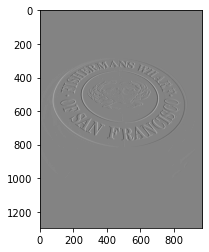

In [2]:
D_x = np.float32([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]) / 8
der_x = cv.filter2D(img_gray, cv.CV_32F, D_x) #the 2nd parameter of filter2D is set to CV_32F to store negative values
plt.imshow(der_x, 'gray')
cv.imwrite('horizontal_derivative.png', der_x) #writing the horizontal derivative image to file

True

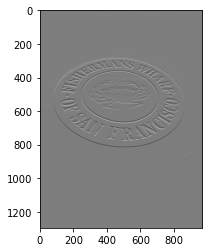

In [3]:
D_y = np.float32([[-1, -2, -1], [0, 0, 0], [1, 2, 1]]) / 8
der_y = cv.filter2D(img_gray, cv.CV_32F, D_y) #the 2nd parameter of filter2D is set to CV_32F to store negative values
plt.imshow(der_y, 'gray')
cv.imwrite('vertical_derivative.png', der_y) #writing the stacked image to file

In [4]:
height, width = img_gray.shape
ori_img_gray = np.zeros((height, width), np.float32) #gradient orientation of img_gray

In [5]:
#Calculating gradient direction
import math
for i in range(height):
    for j in range(width):
        if der_x[i,j] == 0 and der_y[i,j]==0:
            ori_img_gray[i,j] = math.inf
            ori_img_gray[i,j] = ori_img_gray[i,j] * 180/math.pi
        else:
            ori_img_gray[i,j] = math.atan2(der_y[i,j], der_x[i,j])
            ori_img_gray[i,j] = ori_img_gray[i,j] * 180/math.pi
            ori_img_gray[i,j] = ori_img_gray[i,j] + 90 #Converting from Radian to degree
print(ori_img_gray)
print(len(ori_img_gray))

[[ inf 270.  90. ...  inf  inf  inf]
 [ inf 225. 135. ...  inf  inf  inf]
 [ inf  inf  90. ...  inf  inf  inf]
 ...
 [ inf  90. 270. ...  inf  inf  inf]
 [ inf  90. 270. ... 180. 180. 180.]
 [ inf  90. 270. ...  inf  inf  inf]]
1296


In [6]:
#Conversion of [-90,0) to [0,360]
for i in range(height):
    for j in range(width):
        if ori_img_gray[i,j] < 0:
            ori_img_gray[i,j] = ori_img_gray[i,j] + 360
        else:
            ori_img_gray[i,j] = ori_img_gray[i,j]
            
print(len(ori_img_gray))

1296


In [7]:
ori_img_gray

array([[ inf, 270.,  90., ...,  inf,  inf,  inf],
       [ inf, 225., 135., ...,  inf,  inf,  inf],
       [ inf,  inf,  90., ...,  inf,  inf,  inf],
       ...,
       [ inf,  90., 270., ...,  inf,  inf,  inf],
       [ inf,  90., 270., ..., 180., 180., 180.],
       [ inf,  90., 270., ...,  inf,  inf,  inf]], dtype=float32)

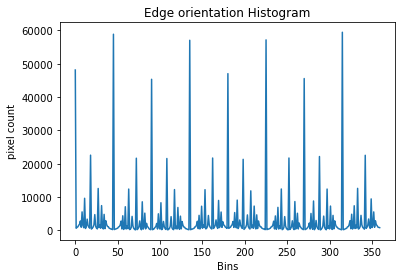

In [8]:
result = np.round_(ori_img_gray)
# create the histogram
histogram, bin_edges = np.histogram(result, bins=360, range=(0, 360))

# configure and draw the histogram figure
plt.figure()
plt.title("Edge orientation Histogram")
plt.xlabel("Bins")
plt.ylabel("pixel count")

plt.plot(bin_edges[0:-1], histogram)
plt.savefig('fisherman_histogram.png')
plt.show()


### ii) Edge orientation for 2nd image

In [9]:
img = cv.imread('empire.jpg') #load image
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

True

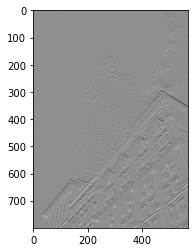

In [10]:
#X-derivative
D_x = np.float32([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]) / 8
der_x = cv.filter2D(img_gray, cv.CV_32F, D_x) #the 2nd parameter of filter2D is set to CV_32F to store negative values
plt.imshow(der_x, 'gray')
cv.imwrite('empire_horizontal_derivative.png', der_x) #writing the horizontal derivative image to file

#Y-derivative
D_y = np.float32([[-1, -2, -1], [0, 0, 0], [1, 2, 1]]) / 8
der_y = cv.filter2D(img_gray, cv.CV_32F, D_y) #the 2nd parameter of filter2D is set to CV_32F to store negative values
plt.imshow(der_y, 'gray')
cv.imwrite('empire_vertical_derivative.png', der_y) #writing the stacked image to file

In [11]:
height, width = img_gray.shape
ori_img_gray = np.zeros((height, width), np.float32) #gradient orientation of img_gray

In [12]:
#Calculating gradient direction
for i in range(height):
    for j in range(width):
        if der_x[i,j] == 0 and der_y[i,j]==0:
            ori_img_gray[i,j] = math.inf
            ori_img_gray[i,j] = ori_img_gray[i,j] * 180/math.pi
        else:
            ori_img_gray[i,j] = math.atan2(der_y[i,j], der_x[i,j])
            ori_img_gray[i,j] = ori_img_gray[i,j] * 180/math.pi
            ori_img_gray[i,j] = ori_img_gray[i,j] + 90 #Converting from Radian to degree
print(ori_img_gray)
print(len(ori_img_gray))

[[       inf 270.        90.       ... 270.       270.              inf]
 [180.       225.       168.69006  ... -33.69007    0.         0.      ]
 [  0.       -45.         0.       ... -33.69007    8.130104   0.      ]
 ...
 [  0.        45.       -11.309937 ... 141.84277  162.89728  180.      ]
 [180.       108.43495  -63.43495  ... 119.0546   135.       180.      ]
 [       inf  90.       270.       ...  90.        90.              inf]]
800


In [13]:
#Conversion of [-90,0) to [0,360]

for i in range(height):
    for j in range(width):
        if ori_img_gray[i,j] < 0:
            ori_img_gray[i,j] = ori_img_gray[i,j] + 360
        else:
            ori_img_gray[i,j] = ori_img_gray[i,j]
            
print(len(ori_img_gray))

800


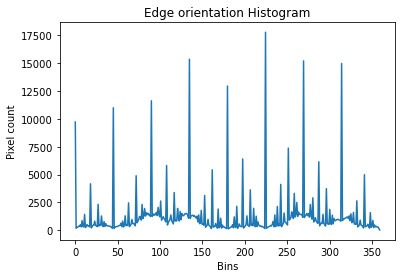

In [14]:
result1 = np.round_(ori_img_gray)
# create the histogram
histogram1, bin_edges1 = np.histogram(result1, bins=361, range=(0, 360))

# configure and draw the histogram figure
plt.figure()
plt.title("Edge orientation Histogram")
plt.xlabel("Bins")
plt.ylabel("Pixel count")

plt.plot(bin_edges1[0:-1], histogram1)  # <- or here
plt.savefig('empire_histogram.png')
plt.show()

##### Comparing histograms of both images

In [15]:
#Defining functions

def normalisation(hist):
    s=0
    for i in range(0, len(hist)):
        s=s+hist[i]
    for i in range(0, len(hist)):
        hist[i] = hist[i]/s
        
    return hist

def kl_divergence(h1, h2):
    h1 = h1 + 0.000001
    h2 = h2 + 0.000001
    return sum(h1[i] * log(h1[i]/h2[i]) for i in range(len(h1) - 1))

def si_square(h1,h2):
    h1 = h1 + 0.000001
    h2 = h2 + 0.000001
    return sum((h1[i] - h2[i])**2/(h1[i]+h2[i]) for i in range(len(h1) - 1))

#Normalising histograms
h1_normalised = normalisation(bin_edges) #Image 1
h2_normalised = normalisation(bin_edges1) #Image 2

In [16]:
# calculate the kl divergence

#img1 vs img2
dist_img1_img2 = kl_divergence(h1_normalised, h2_normalised)
dist_img2_img1 = kl_divergence(h2_normalised, h1_normalised)

print('KL Divergence between histogram 1 and 2 is ', dist_img1_img2 + dist_img2_img1)

KL Divergence between histogram 1 and 2 is  -9.356073398577441e-08


In [17]:
#img1 vs img2
dist_img1_img2 = si_square(h1_normalised, h2_normalised)

print('Si square distance between image 1 and 2 is ', dist_img1_img2)

Si square distance between image 1 and 2 is  1.521403645317251e-05


## 2. Applying morphology for document skew estimation

#### Binary images

In [18]:
doc = cv.imread('doc.jpg', 0) #Note that the second parameter of imread is set to 0

In [19]:
threshold = 200
ret, doc_bin = cv.threshold(doc, threshold, 255, cv.THRESH_BINARY)

True

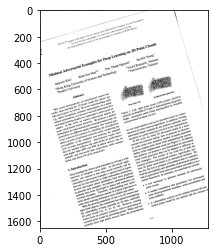

In [20]:
plt.imshow(doc_bin, 'gray')
cv.imwrite('doc_bin.png', doc_bin) #writing the binary image

### 2.2. Morphological transforms for document skew estimation

#### Step 1: Applying morphological transforms to merge letters in words and words in text lines.

In [21]:
closing_se = np.ones((1, 15), np.int64) #structuring element for closing

True

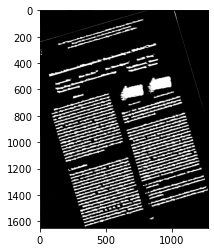

In [22]:
doc_bin = 255 - doc_bin #convert black/white to white/black 

#Applying closing operation
closing = cv.morphologyEx(doc_bin, cv.MORPH_CLOSE, closing_se)
plt.imshow(closing, 'gray')
cv.imwrite('closing_operation.png', closing) #writing the closing image

True

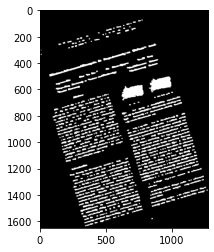

In [23]:
opening_se = np.ones((8, 8), np.int64) #structuring element for opening

opening = cv.morphologyEx(closing, cv.MORPH_OPEN, opening_se)
plt.imshow(opening, 'gray')
cv.imwrite('opening_operation.png', opening) #writing the opening image

#### Step 2: Applying morphological transforms to merge letters in words and words in text lines.

In [24]:
# connected component labelling
num_labels, labels_im = cv.connectedComponents(opening) 

In [25]:
def ExtractConnectedComponents(num_labels, labels_im):
    connected_components = [[] for i in range(0, num_labels)]
    height, width = labels_im.shape
    for i in range(0, height):
        for j in range(0, width):
            if labels_im[i, j] >= 0:
                connected_components[labels_im[i, j]].append((j, i))

    return connected_components 

In [26]:
connected_components = ExtractConnectedComponents(num_labels, labels_im)

In [27]:
connected_components

[[(5, 0),
  (6, 0),
  (7, 0),
  (8, 0),
  (9, 0),
  (10, 0),
  (11, 0),
  (12, 0),
  (13, 0),
  (14, 0),
  (15, 0),
  (16, 0),
  (17, 0),
  (18, 0),
  (19, 0),
  (20, 0),
  (21, 0),
  (22, 0),
  (23, 0),
  (24, 0),
  (25, 0),
  (26, 0),
  (27, 0),
  (28, 0),
  (29, 0),
  (30, 0),
  (31, 0),
  (32, 0),
  (33, 0),
  (34, 0),
  (35, 0),
  (36, 0),
  (37, 0),
  (38, 0),
  (39, 0),
  (40, 0),
  (41, 0),
  (42, 0),
  (43, 0),
  (44, 0),
  (45, 0),
  (46, 0),
  (47, 0),
  (48, 0),
  (49, 0),
  (50, 0),
  (51, 0),
  (52, 0),
  (53, 0),
  (54, 0),
  (55, 0),
  (56, 0),
  (57, 0),
  (58, 0),
  (59, 0),
  (60, 0),
  (61, 0),
  (62, 0),
  (63, 0),
  (64, 0),
  (65, 0),
  (66, 0),
  (67, 0),
  (68, 0),
  (69, 0),
  (70, 0),
  (71, 0),
  (72, 0),
  (73, 0),
  (74, 0),
  (75, 0),
  (76, 0),
  (77, 0),
  (78, 0),
  (79, 0),
  (80, 0),
  (81, 0),
  (82, 0),
  (83, 0),
  (84, 0),
  (85, 0),
  (86, 0),
  (87, 0),
  (88, 0),
  (89, 0),
  (90, 0),
  (91, 0),
  (92, 0),
  (93, 0),
  (94, 0),
  (95, 0),
  (9

In [12]:
opening

array([[255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8)

In [13]:
connected_components

[[(5, 0),
  (6, 0),
  (7, 0),
  (8, 0),
  (9, 0),
  (10, 0),
  (11, 0),
  (12, 0),
  (13, 0),
  (14, 0),
  (15, 0),
  (16, 0),
  (17, 0),
  (18, 0),
  (19, 0),
  (20, 0),
  (21, 0),
  (22, 0),
  (23, 0),
  (24, 0),
  (25, 0),
  (26, 0),
  (27, 0),
  (28, 0),
  (29, 0),
  (30, 0),
  (31, 0),
  (32, 0),
  (33, 0),
  (34, 0),
  (35, 0),
  (36, 0),
  (37, 0),
  (38, 0),
  (39, 0),
  (40, 0),
  (41, 0),
  (42, 0),
  (43, 0),
  (44, 0),
  (45, 0),
  (46, 0),
  (47, 0),
  (48, 0),
  (49, 0),
  (50, 0),
  (51, 0),
  (52, 0),
  (53, 0),
  (54, 0),
  (55, 0),
  (56, 0),
  (57, 0),
  (58, 0),
  (59, 0),
  (60, 0),
  (61, 0),
  (62, 0),
  (63, 0),
  (64, 0),
  (65, 0),
  (66, 0),
  (67, 0),
  (68, 0),
  (69, 0),
  (70, 0),
  (71, 0),
  (72, 0),
  (73, 0),
  (74, 0),
  (75, 0),
  (76, 0),
  (77, 0),
  (78, 0),
  (79, 0),
  (80, 0),
  (81, 0),
  (82, 0),
  (83, 0),
  (84, 0),
  (85, 0),
  (86, 0),
  (87, 0),
  (88, 0),
  (89, 0),
  (90, 0),
  (91, 0),
  (92, 0),
  (93, 0),
  (94, 0),
  (95, 0),
  (9

#### Step 3. Find the orientation for connected components (i.e., text lines) using least squares regression

In [27]:
import math
def FindOrientation(cc):
    mx = 0
    my = 0
    mxx = 0
    myy = 0
    mxy = 0

    for i in range(0, len(cc)):
        mx += cc[i][0] # cc[i][0] is used to store the x coordinate of pixel cc[i]
        my += cc[i][1] # cc[i][1] is used to store the y coordinate of pixel cc[i]
    mx /= len(cc)
    my /= len(cc)

    for i in range(0, len(cc)):
        dx = cc[i][0] - mx
        dy = cc[i][1] - my 
        mxx += (dx * dx)
        myy += (dy * dy)
        mxy += (dx * dy)
    mxx /= len(cc)
    myy /= len(cc)
    mxy /= len(cc)

    theta = - math.atan2(2 * mxy, mxx - myy) / 2
    return theta 


In [28]:
orientations = np.zeros(num_labels, np.float32)
for i in range(0, num_labels):
    orientations[i] = FindOrientation(connected_components[i])

#### Step 4. The orientation of the entire document is computed as the median of the orientations of all text lines. We will call median method from statistics to get this median.

In [29]:
orientation = statistics.median(orientations)
print(orientation)

0.23484191298484802


#### Step 5. We now deskew the image in doc by rotating it with an angle of -orientation 

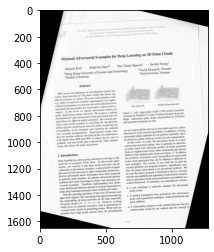

In [30]:
# rotate image
height, width = doc.shape
c_x = (width - 1) / 2.0 # column index varies in [0, width-1]
c_y = (height - 1) / 2.0 # row index varies in [0, height-1]
c = (c_x, c_y) # A point is defined by x and y coordinate
M = cv.getRotationMatrix2D(c, -orientation * 180 / math.pi, 1)
doc_deskewed = cv.warpAffine(doc, M, (width, height))
plt.imshow(doc_deskewed, 'gray')

In [31]:
cv.imwrite('doc_deskewed.png', doc_deskewed) #writing the binary image

True

### ii) Skew estimation for 2nd image

#### Binary images

In [32]:
doc = cv.imread('doc_1.jpg', 0) #Note that the second parameter of imread is set to 0

In [33]:
threshold = 200
ret, doc_bin = cv.threshold(doc, threshold, 255, cv.THRESH_BINARY)

True

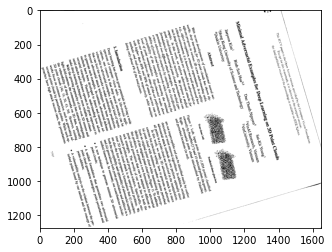

In [34]:
plt.imshow(doc_bin, 'gray')
cv.imwrite('doc1_bin.png', doc_bin) #writing the binary image

### 2.2. Morphological transforms for document skew estimation

#### Step 1: Applying morphological transforms to merge letters in words and words in text lines.

In [35]:
closing_se = np.ones((15, 1), np.int64) #structuring element for closing

True

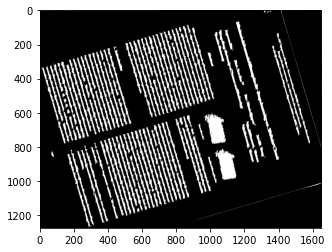

In [36]:
doc_bin = 255 - doc_bin #convert black/white to white/black 

#Applying closing operation
closing = cv.morphologyEx(doc_bin, cv.MORPH_CLOSE, closing_se)
plt.imshow(closing, 'gray')
cv.imwrite('closing_operation_doc1.png', closing) #writing the closing image

True

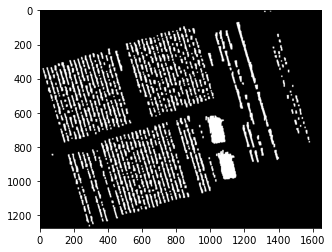

In [37]:
opening_se = np.ones((8, 8), np.int64) #structuring element for opening

opening = cv.morphologyEx(closing, cv.MORPH_OPEN, opening_se)
plt.imshow(opening, 'gray')
cv.imwrite('opening_operation_doc1.png', opening) #writing the opening image

#### Step 2: Applying morphological transforms to merge letters in words and words in text lines.

In [38]:
# connected component labelling
num_labels, labels_im = cv.connectedComponents(opening) 

In [39]:
def ExtractConnectedComponents(num_labels, labels_im):
    connected_components = [[] for i in range(0, num_labels)]
    height, width = labels_im.shape
    for i in range(0, height):
        for j in range(0, width):
            if labels_im[i, j] >= 0:
                connected_components[labels_im[i, j]].append((j, i))

    return connected_components 

In [40]:
connected_components = ExtractConnectedComponents(num_labels, labels_im)

#### Step 3. Find the orientation for connected components (i.e., text lines) using least squares regression

In [41]:
import math
def FindOrientation(cc):
    mx = 0
    my = 0
    mxx = 0
    myy = 0
    mxy = 0

    for i in range(0, len(cc)):
        mx += cc[i][0] # cc[i][0] is used to store the x coordinate of pixel cc[i]
        my += cc[i][1] # cc[i][1] is used to store the y coordinate of pixel cc[i]
    mx /= len(cc)
    my /= len(cc)

    for i in range(0, len(cc)):
        dx = cc[i][0] - mx
        dy = cc[i][1] - my 
        mxx += (dx * dx)
        myy += (dy * dy)
        mxy += (dx * dy)
    mxx /= len(cc)
    myy /= len(cc)
    mxy /= len(cc)

    theta = - math.atan2(2 * mxy, mxx - myy) / 2
    return theta 


In [42]:
orientations = np.zeros(num_labels, np.float32)
for i in range(0, num_labels):
    orientations[i] = FindOrientation(connected_components[i])

#### Step 4. The orientation of the entire document is computed as the median of the orientations of all text lines. We will call median method from statistics to get this median.

In [43]:
orientation = statistics.median(orientations)
print(orientation)

-1.3124411


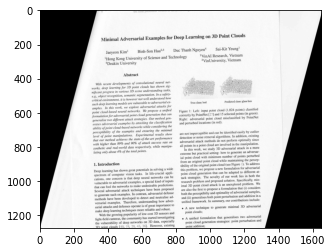

In [44]:
# rotate image
height, width = doc.shape
c_x = (width - 1) / 2.0 # column index varies in [0, width-1]
c_y = (height - 1) / 2.0 # row index varies in [0, height-1]
c = (c_x, c_y) # A point is defined by x and y coordinate
M = cv.getRotationMatrix2D(c, -orientation * 180 / math.pi, 1)
doc_deskewed = cv.warpAffine(doc, M, (width, height))
plt.imshow(doc_deskewed, 'gray')

In [45]:
cv.imwrite('doc1_deskewed.png', doc_deskewed) #writing the binary image

True